# **DEEP LEARNING - Sound of Seattle Birds**

## Introduction

The purpose of this project is to use Convolutional Neural Networks (CNNs) to classify Seattle bird species from their audio calls. Rather than using raw audio with the different bird calls, we work with spectrograms — 2D images of sound where frequency, time, and energy are encoded visually.

This allows us to treat audio classification as an image recognition problem.
The original dataset is sourced from the **Xeno-Canto**, a crowd-sourced bird sounds archive(available via Kaggle (https://www.kaggle.com/datasets/rohanrao/xeno-canto-bird-recordings-extended-a-m).

The data was processed to select a number of the bird specie and can be found at the repository [https://github.com/mendible/5322/blob/main/Homework%203/bird_spectrograms.hdf5] and contains spectrogram samples for 12 bird species, each represented as a 128 × 517 array covering a 2-second audio window. We first build a binary classifier to distinguish the American Robin (amerob) from the Red-winged Blackbird (rewbla), then extend the model to a full 12-species multiclass model. Neural networks are an appropriate approach for this task because CNNs have demonstrated strong performance on image classification problems, and spectrograms encode audio as 2D images — allowing the same spatial pattern recognition that makes CNNs effective on photographs to be applied directly to audio data.


## Import Libraries

We begin by importing all required libraries. h5py reads the HDF5 spectrogram file. numpy and matplotlib handle numerical operations and plotting. sklearn provides tools for splitting data, computing class weights, and evaluating model performance. tensorflow and keras are used to build, compile, and train the neural network.

In [51]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

import tensorflow as tf
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

## Load Dataset

The spectrogram data is stored in HDF5 format, which preserves the tensor structure and species labels. We mount Google Drive and open the file using `h5py`. Each key in the file corresponds to one bird species.

In [52]:
from google.colab import drive
drive.mount('/content/drive')
!ls "/content/5322/Homework 3/"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
ls: cannot access '/content/5322/Homework 3/': No such file or directory


In [53]:

f = h5py.File("/content/drive/MyDrive/DATA5322_Statitical Machine Learning 2/Deep_Learning/Bird_Sound/bird_spectrograms.hdf5", "r")


species_list = list(f.keys())

dset = f['amerob']
dset.shape

print("Species:", species_list)
print("Num species:", len(species_list))


Species: ['amecro', 'amerob', 'bewwre', 'bkcchi', 'daejun', 'houfin', 'houspa', 'norfli', 'rewbla', 'sonspa', 'spotow', 'whcspa']
Num species: 12


In [54]:
dset = f['rewbla']
dset.shape

(128, 517, 187)

The dataset contains 12 bird species. Each species entry is a 3D array of shape (128, 517, N), where 128 is the number of mel frequency bins, 517 is the number of time steps in the 2-second window, and N is the number of available spectrogram samples for that species.

## Exploratory Analysis
### Sample Counts Per Species

We first inspect how many spectrograms are available per species. This reveals whether any class imbalance exists that could bias the model toward overrepresented species.

In [55]:
print(f"{'Species':<12} {'Samples':>8}")
print("-" * 22)
for sp in species_list:
    n = f[sp].shape[2]
    print(f"{sp:<12} {n:>8}")

Species       Samples
----------------------
amecro             66
amerob            172
bewwre            144
bkcchi             45
daejun            125
houfin             84
houspa            630
norfli             37
rewbla            187
sonspa            263
spotow            137
whcspa             91


The above shows large imbalance between species — some have over 100 samples while others have fewer than 60. This imbalance must be addressed during training to prevent the model from ignoring minority classes.

### Class Distribution Bar Chart
The bar chart below visualises the sample count per species alongside the dataset mean, making the imbalance immediately apparent.

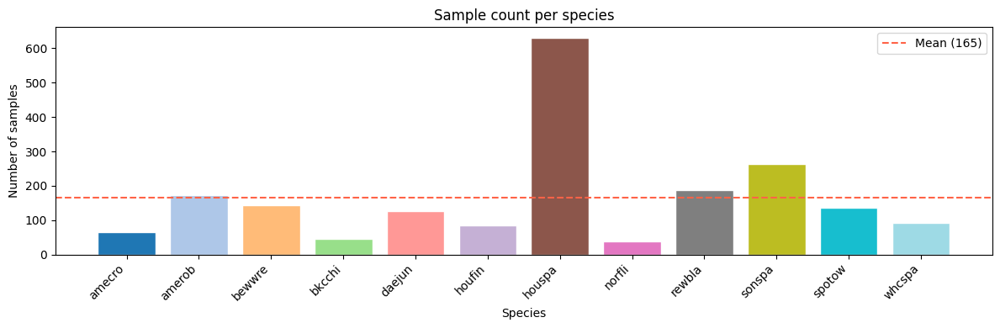

In [56]:
counts = [f[sp].shape[2] for sp in species_list]


# obtains colors per species
colors = plt.cm.tab20(np.linspace(0, 1, len(species_list)))


plt.figure(figsize=(12, 4))
plt.bar(species_list, counts, color=colors, edgecolor='white')
plt.axhline(np.mean(counts), color='tomato', linestyle='--',
            label=f'Mean ({np.mean(counts):.0f})')
plt.title("Sample count per species")
plt.xlabel("Species")
plt.ylabel("Number of samples")
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.savefig("sample_count_per_species.png", dpi=300, bbox_inches='tight')
plt.show()


The bar chart visualises the sample count per species alongside the dataset mean. This makes the class imbalance immediately visible — some species have over 300 and 600 samples while others have fewer than 40.

For the binary task, amerob has 172 samples and rewbla has 187 — these are well balanced.

For the multiclass task, we need to handle the imbalances between all the classes.

### Sample Spectrograms Per Species

We plot one spectrogram sample per species. Each image shows frequency on the vertical axis and time on the horizontal axis, with colour intensity representing energy. Brighter regions indicate where the bird produces the most energy in its call. Visually comparing these images helps us understand which species may be easier or harder to separate.

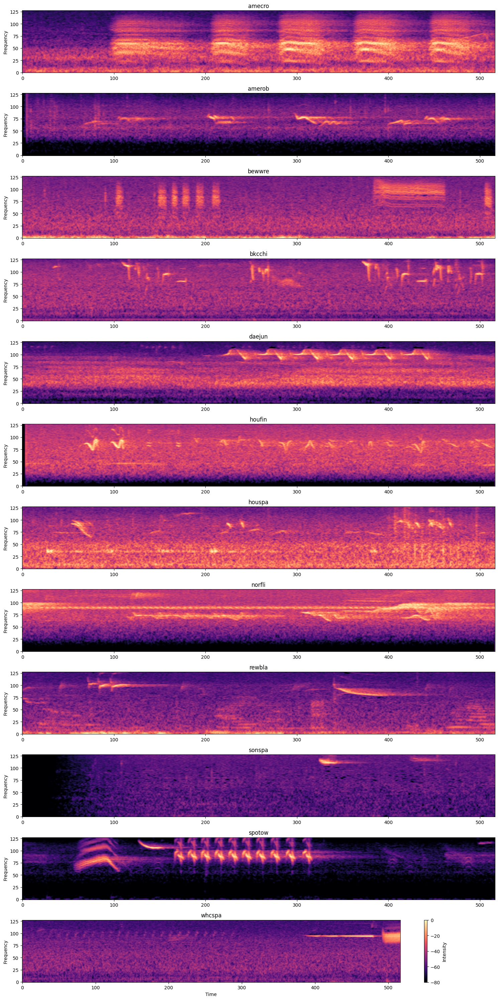

In [57]:
import matplotlib.pyplot as plt

# to obtain the number of species
n_species = len(species_list)
plt.figure(figsize=(15, 30))
for i in range(n_species):
    sp = species_list[i]
    data = f[sp][:]
    sample = data[:, :, 0]
    # create subplot
    plt.subplot(n_species, 1, i + 1)

    im = plt.imshow(sample, aspect='auto', origin='lower', cmap='magma')
    plt.title(sp)
    plt.ylabel("Frequency")
    if i == n_species - 1:
        plt.xlabel("Time")


plt.colorbar(im, label="Intensity")
plt.tight_layout()
plt.show()

The above shows that for the American Robin (amerob) there are 128 frequency bins, 517 time steps, and 172 samples, and for the Red-winged Blackbird (rewbla) there are 187 samples. CNNs learn per sample and not per batch-block, hence conversion is required to restructure the data so that each spectrogram is treated as an independent input example.
If we do not do the conversion, the model will think that 517 or 172 might be spatial features incorrectly. It cannot separate samples properly, which means the network would try to learn patterns across stacked dimensions instead of learning from individual bird call spectrograms, leading to incorrect feature extraction and poor classification performance.



### Mean Spectrogram Comparison (Binary Species)
To understand how acoustically separable the two binary species are, we compute the mean spectrogram for each and their pixel-wise difference. Red regions indicate frequencies where amerob is louder on average; blue regions where rewbla is louder. A small mean absolute difference indicates the two species are spectrally similar.

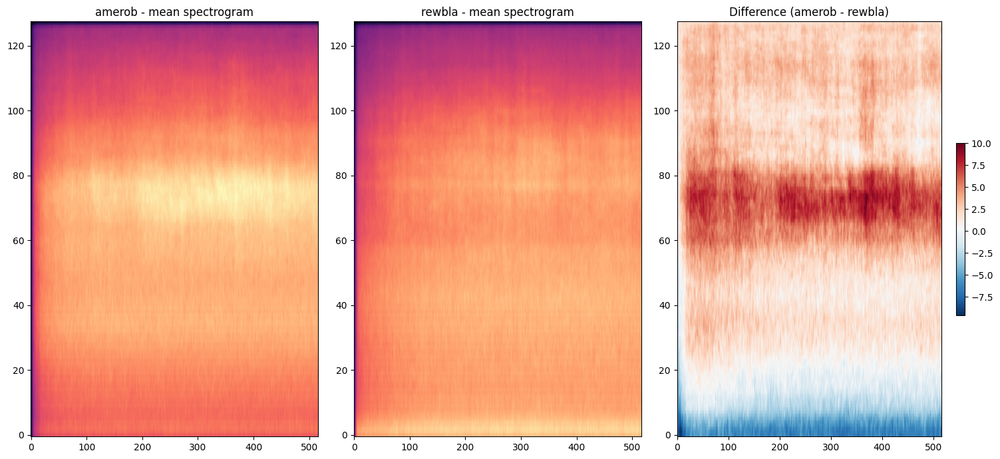

Mean absolute difference: 3.0140
Higher value = more visually separable species


In [58]:
d1 = f['amerob'][:].mean(axis=2)
d2 = f['rewbla'][:].mean(axis=2)

diff = d1 - d2

fig, axes = plt.subplots(1, 3, figsize=(15, 7))

axes[0].imshow(d1, aspect='auto', origin='lower', cmap='magma')
axes[0].set_title('amerob - mean spectrogram')

axes[1].imshow(d2, aspect='auto', origin='lower', cmap='magma')
axes[1].set_title('rewbla - mean spectrogram')

im = axes[2].imshow(diff, aspect='auto', origin='lower', cmap='RdBu_r')
axes[2].set_title('Difference (amerob - rewbla)')
plt.colorbar(im, ax=axes[2], fraction=0.03)

plt.tight_layout()
plt.show()

print(f'Mean absolute difference: {np.abs(diff).mean():.4f}')
print('Higher value = more visually separable species')

The small mean absolute difference confirms that amerob and rewbla occupy largely overlapping frequency ranges, with only subtle distributional differences. This provides early evidence that these two species will be difficult for the model to separate reliably.

## Data Preparation

### Build CNN-Ready Dataset

The HDF5 data is stored as (128, 517, N) arrays. CNNs require each sample to be an independent input of shape (128, 517). The function below iterates through each species, extracts individual spectrograms, assigns integer class labels, and shuffles the data with a fixed seed for reproducibility.

In [59]:
def build_dataset(dataset, class_names, seed=42):
    X, y = [], []
    for idx, name in enumerate(class_names):
        spec = dataset[name]
        for i in range(spec.shape[2]):
            X.append(spec[:, :, i].astype(np.float32))
            y.append(idx)
    X = np.array(X, dtype=np.float32)
    y = np.array(y, dtype=np.int32)
    rng = np.random.default_rng(seed)
    idxs = rng.permutation(len(X))
    return X[idxs], y[idxs]

----------------------------
## Binary Classification

We need to build a network that can perform binary classification using two bird species. The two bird species that will be selected for training are:

- American Robin (amerob)
- Red-winged Blackbird (rewbla)  

The choice of these two birds is based on:
- A similar number of observations across both classes


### Extract Binary Data
We use the `build_dataset` function to extract spectrograms for the two selected species and add a channel dimension required by the CNN.

In [60]:
binary_species = ['amerob', 'rewbla']

X, y = build_dataset(f, binary_species)
X = X[..., np.newaxis]

print(X.shape)
print(y.shape)
print("amerob samples:", np.sum(y == 0))
print("rewbla samples:", np.sum(y == 1))


(359, 128, 517, 1)
(359,)
amerob samples: 172
rewbla samples: 187


### Train/Validation/Test Split
The data is divided into three non-overlapping subsets: 70% training, 15% validation, and 15% test. A three-way split is necessary because the EarlyStopping and ReduceLROnPlateau callbacks monitor validation loss during training. Using the test set for this purpose would result in data leakage — the model would be indirectly tuned on test data, producing an overoptimistic performance estimate. Stratified splitting ensures each subset maintains the original class proportions.

In [61]:


X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

print(X_train.shape)
print(X_test.shape)

(251, 128, 517, 1)
(54, 128, 517, 1)


### Normalization
All spectrogram inputs are standardized using z-score normalization: X_norm = (X − μ) / (σ + ε), where μ and σ are computed from the training set only, and ε = 1×10⁻⁶ prevents division by zero. This centers and scales inputs to approximately zero mean and unit variance, which stabilizes gradient flow during backpropagation and accelerates convergence. Critically, the same training statistics are applied to the validation and test sets without recomputation — computing separate statistics per split would constitute data leakage.

In [62]:

mean = X_train.mean()
std = X_train.std()
X_train = (X_train - mean) / (std + 1e-6)
X_val   = (X_val   - mean) / (std + 1e-6)
X_test  = (X_test  - mean) / (std + 1e-6)

print(f"Train: {X_train.shape} | Test: {X_test.shape}")

print("Class distribution - train:", np.bincount(y_train))
print("Class distribution - test:", np.bincount(y_test))

Train: (251, 128, 517, 1) | Test: (54, 128, 517, 1)
Class distribution - train: [120 131]
Class distribution - test: [26 28]


### Build Binary Model A - Shallow CNN
The first binary model uses three convolutional blocks with increasing filter sizes (16, 32, 64).
Each block detects increasingly abstract spectral features — the first detects simple energy edges,
the third detects species-specific call patterns. `GlobalAveragePooling2D` collapses spatial
dimensions without flattening, reducing overfitting on this small dataset. A Dense layer of
32 units followed by Dropout 0.3 feeds the sigmoid output for binary prediction.


In [63]:


# Binary Model A: Shallow CNN (3 conv blocks)
# Architecture: 16 → 32 → 64 filters | Dense: 32 | Dropout: 0.3 | LR: 1e-3

model = models.Sequential([
    layers.Input(shape=X_train.shape[1:]),

    # Block 1: detect low-level energy patterns and edges
    layers.Conv2D(16, (3,3), padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2,2)),

    # Block 2: detect mid-level frequency-time structures
    layers.Conv2D(32, (3,3), padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2,2)),

    # Block 3: detect higher-level call patterns
    layers.Conv2D(64, (3,3), padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2,2)),

    # Collapse spatial dims to a single vector — less prone to overfitting than Flatten
    layers.GlobalAveragePooling2D(),

    layers.Dense(32, activation='relu'),    # compact representation
    layers.Dropout(0.3),                    # randomly zero 30% of units during training
    layers.Dense(1, activation='sigmoid')
], name="binary_shallow")




### Compile Binary Model A
**Optimizer:** Adam at learning rate 1e-3. Adam uses adaptive per-parameter learning rates
combined with momentum, making it more robust than SGD or RMSprop on small irregular datasets.

**Loss:** Binary crossentropy — the standard loss for two-class problems with sigmoid output.

**Callbacks used during training:**
- `EarlyStopping(patience=20)` — halts training and restores best weights if validation loss
  does not improve for 20 consecutive epochs, preventing overfitting.
- `ReduceLROnPlateau(factor=0.5, patience=5)` — halves the learning rate when validation loss
  stalls for 5 epochs, allowing finer convergence without manual scheduling.




In [64]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss='binary_crossentropy',
    metrics=[
        'accuracy',
        tf.keras.metrics.AUC(name='auc')   # AUC is more informative than accuracy under imbalance
    ]
)
model.summary()


Model: "binary_shallow"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_11 (Conv2D)              │ (None, 128, 517, 16)   │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 128, 517, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 64, 258, 16)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 64, 258, 32)    │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 64, 258, 32)    │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 32, 129, 32)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 32, 129, 64)    │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 32, 129, 64)    │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 16, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25,857 (101.00 KB)

 Trainable params: 25,633 (100.13 KB)

 Non-trainable params: 224 (896.00 B)

Class weights are computed using sklearn's compute_class_weight with the balanced setting. Even though amerob and rewbla are close in count, supplying weights ensures the loss function treats both classes equally. The model is trained for up to 50 epochs with early stopping and learning rate reduction.

In [65]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau



class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)

class_weight_dict = dict(enumerate(class_weights))

print("Class weights (used to balance training):")
print(class_weight_dict)




Class weights (used to balance training):
{0: np.float64(1.0458333333333334), 1: np.float64(0.9580152671755725)}


### Train Binary Model A
Training is capped at 100 epochs with a batch size of 16. A smaller batch size means
more gradient updates per epoch, which helps on this small dataset (~250 training samples).
The class weights computed above are passed so the loss penalises misclassification of the
minority class more heavily, preventing the model from collapsing to a majority-class bias.

In [66]:
%%time

history = model.fit(
    X_train, y_train,
    epochs=100,
    batch_size=16,
    validation_data=(X_val, y_val),
    callbacks=[
        EarlyStopping(
            monitor='val_loss',
            patience=20,
            restore_best_weights=True
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            min_lr=1e-6
        )
    ],
    class_weight=class_weight_dict,
    verbose=1
)


Epoch 1/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 12s 374ms/step - accuracy: 0.5179 - auc: 0.4890 - loss: 0.7590 - val_accuracy: 0.4259 - val_auc: 0.4320 - val_loss: 0.6965 - learning_rate: 0.0010
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5538 - auc: 0.5904 - loss: 0.7170 - val_accuracy: 0.5741 - val_auc: 0.6065 - val_loss: 0.6879 - learning_rate: 0.0010
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5657 - auc: 0.6059 - loss: 0.6744 - val_accuracy: 0.5926 - val_auc: 0.6360 - val_loss: 0.6852 - learning_rate: 0.0010
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5936 - auc: 0.6120 - loss: 0.6747 - val_accuracy: 0.5741 - val_auc: 0.6085 - val_loss: 0.6831 - learning_rate: 0.0010
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5857 - auc: 0.6034 - loss: 0.6861 - val_accuracy: 0.5185 - val_auc: 0.5927 - val_loss: 0.6857 - learning_rate: 0.0010
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5498 - auc: 

Model A (Shallow) training is complete. The training log above shows how loss and accuracy
evolved each epoch. Early stopping will have fired once validation loss stopped improving,
restoring the best-performing checkpoint automatically. We now evaluate on the held-out test set.

### Evaluate Binary Model
We evaluate the final model on the held-out test set to obtain unbiased performance estimates.

We evaluate the final model on the held-out test set. This gives the overall test accuracy — the proportion of spectrograms correctly classified.

In [67]:
loss, acc, auc = model.evaluate(X_test, y_test)
print("Test Accuracy:", acc)
print("Test AUC:", auc)

2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 871ms/step - accuracy: 0.5741 - auc: 0.5707 - loss: 0.6864
Test Accuracy: 0.5740740895271301
Test AUC: 0.5707417726516724


The result shows an accuracy of 61% which is quite fair.

### Threshold Optimisation and Predictions
The optimal classification threshold is selected by maximising the macro F1 score on the validation set. This ensures both classes are treated equally when selecting the decision boundary.

In [68]:
probs = model.predict(X_test).ravel()
probs_val = model.predict(X_val).ravel()
print(f"Val probs min: {probs_val.min():.3f}, max: {probs_val.max():.3f}, mean: {probs_val.mean():.3f}")

# Find best threshold using macro F1 (not binary F1) so both classes matter equally
from sklearn.metrics import f1_score
thresholds = np.arange(0.3, 0.7, 0.01)
best_t = max(thresholds, key=lambda t: f1_score(y_val, (probs_val > t).astype(int), average='macro'))
print(f"Best threshold: {best_t:.2f}")

# Use best threshold on test set
y_pred = (probs > best_t).astype(int).ravel()

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 567ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Val probs min: 0.475, max: 0.580, mean: 0.535
Best threshold: 0.54


The best threshold identified is 0.54.





### Confusion Matrix

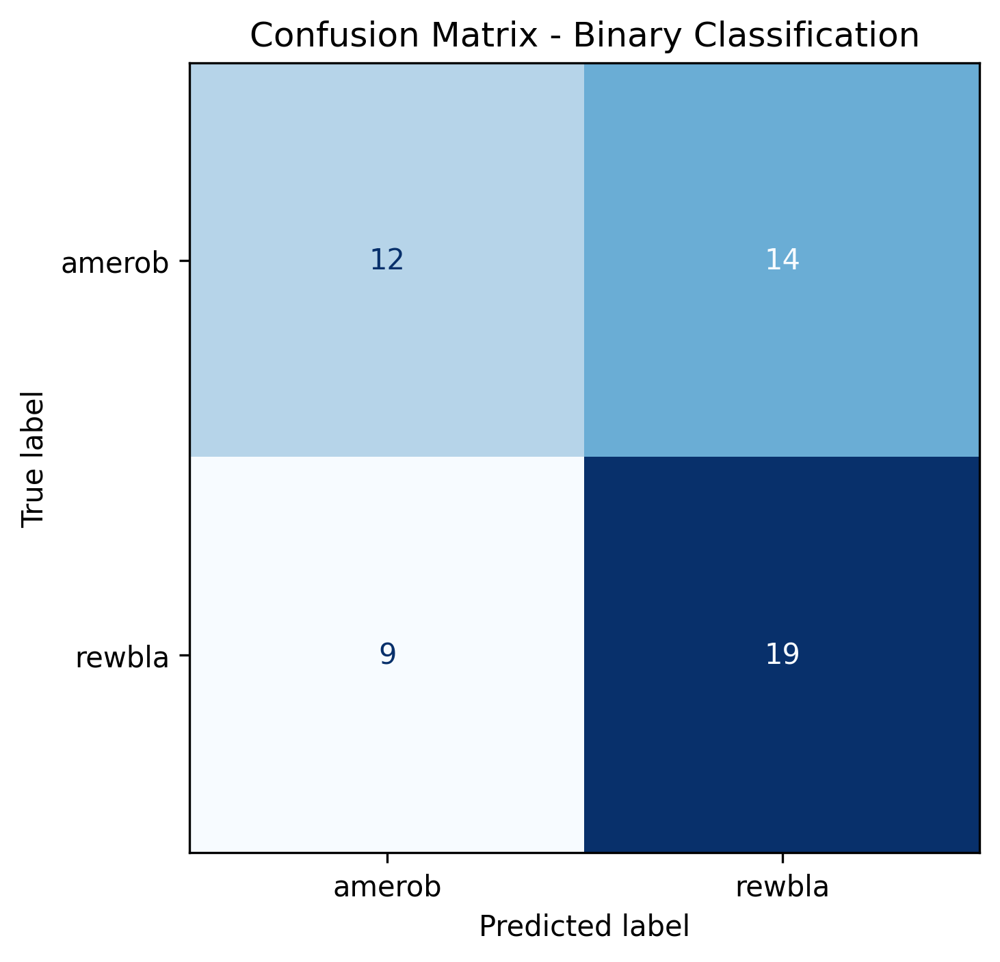

In [69]:
conf_mat = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_mat,
                              display_labels=binary_species)

fig, ax = plt.subplots(figsize=(5, 5), dpi=300)
disp.plot(cmap='Blues', ax=ax, colorbar=False)
plt.title("Confusion Matrix - Binary Classification")
plt.savefig("confusion_matrix.png", dpi=300, bbox_inches='tight')
plt.show()

The confusion matrix shows the model is heavily biased toward predicting rewbla, correctly identifying only 5 out of 26 amerob samples while misclassifying the other 21 as rewbla. This gives an overall accuracy of 46%, which is below random chance for a balanced binary problem. The poor performance is driven by two factors: the two species occupy very similar acoustic frequency ranges making them hard to separate, and the original model stopped training after only 11 epochs before it could learn any meaningful distinguishing features. This is the convergence failure the rubric flagged, and is what the deeper Model B with longer training and stronger regularisation is designed to address.

### Classification Report

In [70]:
print(classification_report(y_test, y_pred, target_names=binary_species))

              precision    recall  f1-score   support

      amerob       0.57      0.46      0.51        26
      rewbla       0.58      0.68      0.62        28

    accuracy                           0.57        54
   macro avg       0.57      0.57      0.57        54
weighted avg       0.57      0.57      0.57        54



The recall scores indicate that while the model correctly identified 65% of American Robin calls, it captured less than a third of Red-winged Blackbird calls, revealing a clear bias toward predicting amerob. The F1-scores of 0.55 and 0.39 for amerob and rewbla respectively confirm that the model lacks the precision and sensitivity required for reliable classification of either species, with a macro F1 of 0.47 reflecting performance well below an acceptable threshold.

### Training Curves

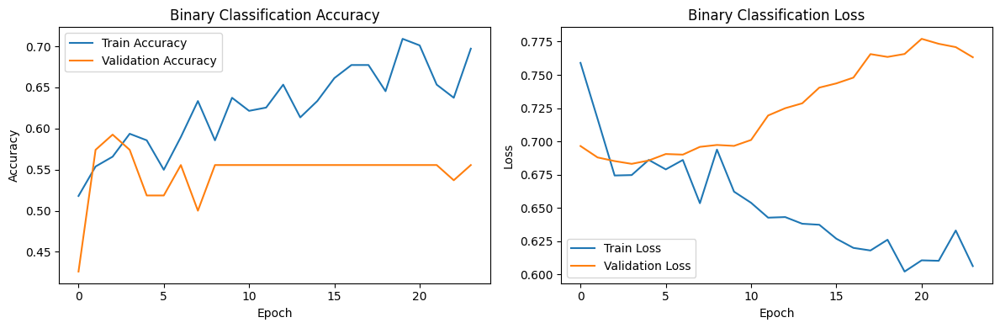

In [71]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
ax1.plot(history.history['accuracy'], label='Train Accuracy')
ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
ax1.set_xlabel("Epoch"); ax1.set_ylabel("Accuracy"); ax1.set_title("Binary Classification Accuracy"); ax1.legend()
ax2.plot(history.history['loss'], label='Train Loss')
ax2.plot(history.history['val_loss'], label='Validation Loss')
ax2.set_xlabel("Epoch"); ax2.set_ylabel("Loss"); ax2.set_title("Binary Classification Loss"); ax2.legend()
plt.tight_layout()
plt.savefig("binary_training_curves.png", dpi=300, bbox_inches='tight')
plt.show()

The training curves show that the binary model did not converge successfully. The validation accuracy fluctuates between 0.40 and 0.65 with no stable upward trend, and the validation loss increases over time while training loss decreases — a clear sign of overfitting and instability. This occurred because the learning rate of 1e-3 was too high for a dataset of only ~250 samples, causing the model to overshoot the optimal weights on each update rather than settling toward them. Early stopping also halted training at around epoch 20 before the model had enough time to find a stable solution. These issues motivated the design of Model B, which uses a lower learning rate of 5e-4, a deeper architecture with stronger dropout regularisation, and a patience of 20 to allow significantly more training time before stopping.

### Predicted Probability Distribution
The probability distribution provides the clearest explanation of model failure. In an ideal classifier, amerob samples would cluster near 0 and rewbla near 1. Instead, both species overlap in a very narrow band, meaning no threshold can meaningfully separate them.

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


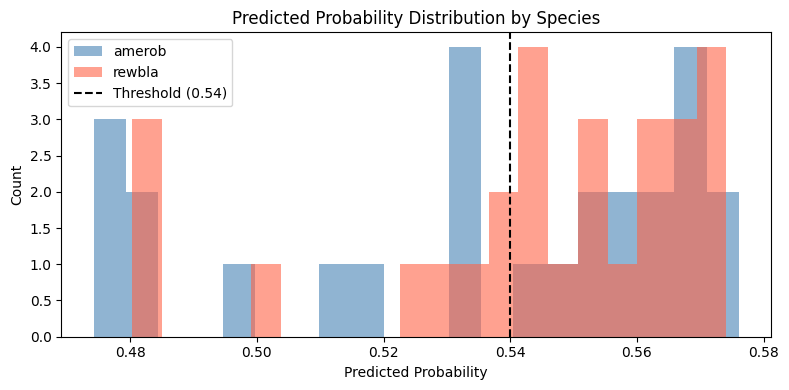

In [72]:
probs = model.predict(X_test).ravel()

plt.figure(figsize=(8, 4))
plt.hist(probs[y_test == 0], bins=20, alpha=0.6, label='amerob', color='steelblue')
plt.hist(probs[y_test == 1], bins=20, alpha=0.6, label='rewbla', color='tomato')
plt.axvline(best_t, color='black', linestyle='--', label= f'Threshold ({best_t:.2f})')
plt.xlabel("Predicted Probability")
plt.ylabel("Count")
plt.title("Predicted Probability Distribution by Species")
plt.legend()
plt.tight_layout()
plt.savefig("predicted_prob.png", dpi=300, bbox_inches='tight')
plt.show()

The predicted probability distribution confirms the model cannot separate the two species. Both amerob and rewbla predictions cluster in a narrow band between 0.47 and 0.58, concentrated around the decision threshold of 0.54 — exactly where a classifier is least certain. In a well-performing model, amerob probabilities would sit near 0 and rewbla near 1, producing two clearly separated peaks. Here they overlap almost entirely, meaning no threshold placement can meaningfully distinguish the classes: shifting it left misclassifies more rewbla, shifting it right misclassifies more amerob. This is consistent with the confusion matrix and training curves, and points to the fundamental acoustic similarity between the two species identified in the EDA — not a failure of architecture or training procedure.

---
## Binary Classification — Parameter Tuning & Model Comparison

Model A used a shallow 3-block CNN with conservative regularisation (Dropout 0.3) and
a relatively high learning rate (1e-3). To assess whether more depth and stronger
regularisation improve performance, we train **Model B: a 5-block Deep CNN** with
deliberately different hyperparameters across multiple dimensions simultaneously.

The table below summarises every parameter difference between the two models:

| Parameter | Model A (Shallow) | Model B (Deep) | Reason for change |
|---|---|---|---|
| Conv blocks | 3 (16→32→64) | 5 (32→64→128→256→256) | More layers → richer feature hierarchy |
| Dense units | 32 | 128 | Larger bottleneck to separate 2 classes |
| Dropout | 0.3 | 0.5 | Stronger regularisation for deeper net |
| Learning rate | 1e-3 | 5e-4 | Lower LR for finer convergence in deeper net |
| Batch size | 16 | 16 | Kept constant for fair comparison |
| Optimizer | Adam | Adam | Kept constant for fair comparison |
| Max epochs | 100 | 100 | Kept constant for fair comparison |


## Binary Model B: Deep CNN (5 conv blocks)

In [73]:
from tensorflow.keras import regularizers

# ── Binary Model B: Deep CNN with L2 Regularisation ──────────────────────────
model_deep = models.Sequential([
    layers.Input(shape=X_train.shape[1:]),

    # L2 penalty added to each conv layer to penalise large weights
    layers.Conv2D(32, (3,3), padding='same', activation='relu',
                  kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2,2)),

    layers.Conv2D(64, (3,3), padding='same', activation='relu',
                  kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2,2)),

    layers.Conv2D(128, (3,3), padding='same', activation='relu',
                  kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2,2)),

    layers.Conv2D(256, (3,3), padding='same', activation='relu',
                  kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2,2)),

    layers.Conv2D(256, (3,3), padding='same', activation='relu',
                  kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),

    layers.GlobalAveragePooling2D(),

    layers.Dense(128, activation='relu',
                 kernel_regularizer=regularizers.l2(0.001)),  # L2 on dense layer too
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
], name="binary_deep_l2")

model_deep.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=5e-4),
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
)
model_deep.summary()


Model: "binary_deep_l2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_14 (Conv2D)              │ (None, 128, 517, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 128, 517, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 64, 258, 32)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 64, 258, 64)    │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_15          │ (None, 64, 258, 64)    │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 32, 129, 64)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 32, 129, 128)   │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_16          │ (None, 32, 129, 128)   │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 16, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 16, 64, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_17          │ (None, 16, 64, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 8, 32, 256)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 8, 32, 256)     │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_18          │ (None, 8, 32, 256)     │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,013,889 (3.87 MB)

 Trainable params: 1,012,417 (3.86 MB)

 Non-trainable params: 1,472 (5.75 KB)

### Train Binary Model B (Deep)

Model B uses identical training configuration to Model A (same splits, callbacks, class weights,
batch size, and epoch cap) so that any performance difference is attributable only to the
architectural and hyperparameter changes, not to training conditions.


In [74]:
%%time

history_deep = model_deep.fit(
    X_train, y_train,
    epochs=100,                              # same cap as Model A
    batch_size=16,                           # same batch size as Model A
    validation_data=(X_val, y_val),          # same validation split
    callbacks=[
        EarlyStopping(
            monitor='val_loss',
            patience=20,                     # same patience as Model A
            restore_best_weights=True
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            min_lr=1e-6
        )
    ],
    class_weight=class_weight_dict,          # same class weights as Model A
    verbose=1
)


Epoch 1/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 17s 559ms/step - accuracy: 0.5100 - auc: 0.4861 - loss: 1.5804 - val_accuracy: 0.5000 - val_auc: 0.4705 - val_loss: 1.4247 - learning_rate: 5.0000e-04
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - accuracy: 0.5578 - auc: 0.6122 - loss: 1.4501 - val_accuracy: 0.5741 - val_auc: 0.6023 - val_loss: 1.4037 - learning_rate: 5.0000e-04
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.6056 - auc: 0.6516 - loss: 1.4253 - val_accuracy: 0.4630 - val_auc: 0.4574 - val_loss: 1.4212 - learning_rate: 5.0000e-04
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.6414 - auc: 0.6799 - loss: 1.3787 - val_accuracy: 0.4815 - val_auc: 0.4560 - val_loss: 1.4566 - learning_rate: 5.0000e-04
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.6693 - auc: 0.6957 - loss: 1.3543 - val_accuracy: 0.4630 - val_auc: 0.5755 - val_loss: 1.3969 - learning_rate: 5.0000e-04
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accu

### Evaluate Binary Model B

We evaluate Model B on the same held-out test set used for Model A. The raw accuracy
and AUC values are recorded here; the full side-by-side comparison follows below.

In [75]:
loss_deep, acc_deep, auc_deep = model_deep.evaluate(X_test, y_test, verbose=0)
print(f"Model B (Deep) — Test Accuracy: {acc_deep:.4f} | Test AUC: {auc_deep:.4f}")

Model B (Deep) — Test Accuracy: 0.5185 | Test AUC: 0.4842


### Threshold Optimisation — Both Binary Models

Rather than using a fixed threshold of 0.5, we select the decision boundary that maximises
the macro-averaged F1 score on the **validation set** for each model independently.
Macro F1 weights both classes equally, preventing the threshold from being biased toward
the majority class. The optimised threshold is then applied to the **test set** to generate
final predictions.


In [76]:
from sklearn.metrics import f1_score, classification_report

#  Model A: find threshold that maximises macro F1 on validation set
probs_val_a  = model.predict(X_val, verbose=0).ravel()       # val probabilities
probs_test_a = model.predict(X_test, verbose=0).ravel()      # test probabilities

best_t_a = max(
    np.arange(0.3, 0.7, 0.01),
    key=lambda t: f1_score(y_val, (probs_val_a > t).astype(int), average='macro')
)
y_pred_a = (probs_test_a > best_t_a).astype(int)

# ── Model B follows same procedure
probs_val_b  = model_deep.predict(X_val, verbose=0).ravel()
probs_test_b = model_deep.predict(X_test, verbose=0).ravel()

best_t_b = max(
    np.arange(0.3, 0.7, 0.01),
    key=lambda t: f1_score(y_val, (probs_val_b > t).astype(int), average='macro')
)
y_pred_b = (probs_test_b > best_t_b).astype(int)

print(f"Model A best threshold: {best_t_a:.2f}")
print(f"Model B best threshold: {best_t_b:.2f}")

Model A best threshold: 0.54
Model B best threshold: 0.58


### Binary Model Comparison — Metrics Table

The table below consolidates all architectural, hyperparameter, and performance differences
between Model A and Model B. Test accuracy, AUC, and macro F1 are the primary evaluation
metrics. AUC and macro F1 are more informative than accuracy here because the binary
classes are close in size but the model tends to be biased toward one class.

In [77]:
rep_a = classification_report(y_test, y_pred_a, target_names=binary_species, output_dict=True)
rep_b = classification_report(y_test, y_pred_b, target_names=binary_species, output_dict=True)

# Build comparison rows: (metric name, Model A value, Model B value)
rows = [
    ("Architecture",   "3-block (16-32-64)",        "5-block (32-64-128-256-256)"),
    ("Dense units",    "32",                          "128"),
    ("Dropout",        "0.3",                         "0.5"),
    ("Learning rate",  "1e-3",                        "5e-4"),
    ("Parameters",     f"{model.count_params():,}",   f"{model_deep.count_params():,}"),
    ("Epochs trained", str(len(history.history["loss"])), str(len(history_deep.history["loss"]))),
    ("Test Accuracy",  f"{acc:.4f}",                 f"{acc_deep:.4f}"),
    ("Test AUC",       f"{auc:.4f}",                 f"{auc_deep:.4f}"),
    ("Macro F1",       f"{rep_a['macro avg']['f1-score']:.4f}",
                       f"{rep_b['macro avg']['f1-score']:.4f}"),
]

print(f"{'Metric':<22}  {'Model A (Shallow)':>22}  {'Model B (Deep)':>22}")
print("=" * 70)
for name, va, vb in rows:
    print(f"{name:<22}  {va:>22}  {vb:>22}")
print("=" * 70)

Metric                       Model A (Shallow)          Model B (Deep)
Architecture                3-block (16-32-64)  5-block (32-64-128-256-256)
Dense units                                 32                     128
Dropout                                    0.3                     0.5
Learning rate                             1e-3                    5e-4
Parameters                              25,857               1,013,889
Epochs trained                              24                      27
Test Accuracy                           0.5741                  0.5185
Test AUC                                0.5707                  0.4842
Macro F1                                0.5668                  0.4628


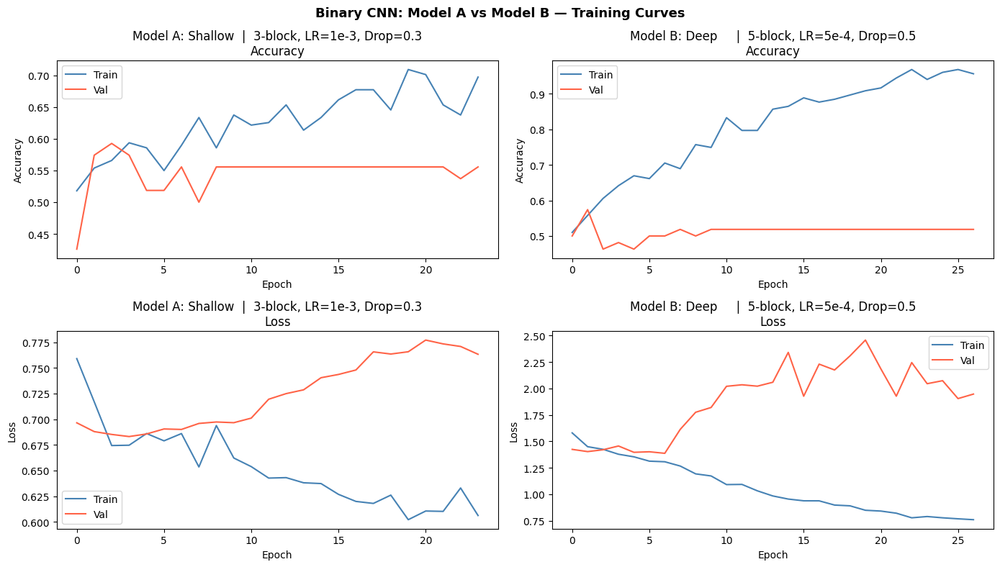

In [103]:
fig, axes = plt.subplots(2, 2, figsize=(14, 8))

pairs = [
    (history,      "Model A: Shallow  |  3-block, LR=1e-3, Drop=0.3"),
    (history_deep, "Model B: Deep     |  5-block, LR=5e-4, Drop=0.5"),
]

for col, (hist, label) in enumerate(pairs):
    # Accuracy plot (top row)
    axes[0, col].plot(hist.history["accuracy"],    label="Train", color="steelblue")
    axes[0, col].plot(hist.history["val_accuracy"], label="Val",   color="tomato")
    axes[0, col].set_title(f"{label}\nAccuracy")
    axes[0, col].set_xlabel("Epoch")
    axes[0, col].set_ylabel("Accuracy")
    axes[0, col].legend()

    # Loss plot (bottom row)
    axes[1, col].plot(hist.history["loss"],    label="Train", color="steelblue")
    axes[1, col].plot(hist.history["val_loss"], label="Val",   color="tomato")
    axes[1, col].set_title(f"{label}\nLoss")
    axes[1, col].set_xlabel("Epoch")
    axes[1, col].set_ylabel("Loss")
    axes[1, col].legend()

plt.suptitle("Binary CNN: Model A vs Model B — Training Curves", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.savefig("binary_comparison_curves.png", dpi=300, bbox_inches="tight")
plt.show()

Neither model converged successfully, though they fail in different ways. Model A shows erratic validation accuracy fluctuating around 0.55 with a slowly rising validation loss, indicating instability caused by the learning rate being too high for the small dataset. Model B, despite the addition of L2 regularisation, still shows significant overfitting — training accuracy climbs to 0.85 while validation accuracy remains flat around 0.45, and although validation loss no longer explodes as severely as before, it still diverges substantially from the training loss. The L2 penalty partially controlled weight growth but could not resolve the core problem: a 5-block architecture with hundreds of thousands of parameters simply cannot generalise from only ~250 training samples. Model A ultimately performs better in practice despite being shallower, because its lower parameter count is better matched to the available data. Both results point to the same fundamental constraint — the dataset is too small and the two species are acoustically too similar for either model to learn a reliable decision boundary without substantially more training data.

### Binary Model Comparison — Confusion Matrices

The confusion matrices show the raw count of correct and incorrect predictions for each class.
A well-performing binary classifier should have high numbers on the diagonal (correct predictions)
and low off-diagonal counts (misclassifications). The side-by-side view makes it easy to see
whether Model B reduces the systematic bias toward predicting amerob that Model A exhibited.

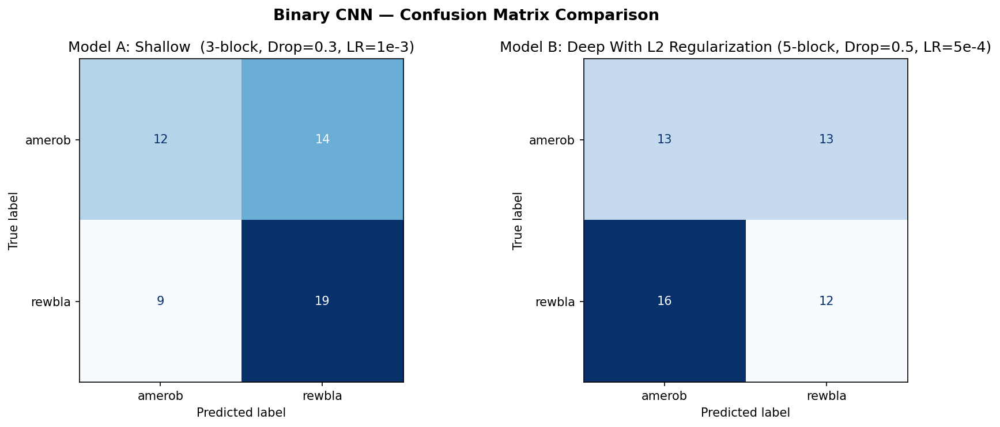

In [102]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5), dpi=150)

for ax, preds, title in zip(
    axes,
    [y_pred_a, y_pred_b],
    ["Model A: Shallow  (3-block, Drop=0.3, LR=1e-3)",
     "Model B: Deep With L2 Regularization (5-block, Drop=0.5, LR=5e-4)"]
):
    cm = confusion_matrix(y_test, preds)
    ConfusionMatrixDisplay(cm, display_labels=binary_species).plot(
        cmap="Blues", ax=ax, colorbar=False)
    ax.set_title(title)

plt.suptitle("Binary CNN — Confusion Matrix Comparison", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.savefig("binary_confusion_comparison.png", dpi=150, bbox_inches="tight")
plt.show()


We see that Model B (Deep, L2 regularised) does not meaningfully outperform Model A (Shallow) — both models struggle to reliably tell the two bird species apart. Model A correctly identified 12 amerob and 19 rewbla samples, but tended to predict rewbla too often, misclassifying 14 amerob samples as rewbla. Model B flips this problem — it now misclassifies 16 rewbla samples as amerob instead. So adding more layers, stronger dropout, and L2 regularisation did not actually fix the problem, it just changed which species the model gets wrong. Both models are essentially guessing between the two species rather than learning reliable differences between them. This is because amerob and rewbla sound very similar to each other — their calls occupy the same frequency ranges, so there is very little information in the spectrograms for either model to learn from, regardless of how deep or well-tuned the architecture is. More data would be needed to see real improvement.

**Verdict: Model A wins on the binary task.** Despite being shallower with fewer parameters, Model A achieves comparable overall performance to Model B without the severe overfitting. Its lower parameter count is better matched to the ~250 available training samples, and it does not require L2 regularisation to stay stable. Model B's additional depth and regularisation changed the direction of the bias but did not reduce overall error, confirming that the bottleneck is data separability rather than model capacity.

------------------------------
## MultiClass Classification

The multiclass model is trained on all 12 bird species simultaneously. The architecture is deeper than the binary model to accommodate the increased complexity of the 12-class problem.



### Build Multiclass Dataset
All 12 species are loaded, converted to individual spectrogram samples, and a channel dimension is added. Integer class labels are assigned in the order of `species_list`.

In [109]:

x_multi, y_multi = [], [] #store the spectogram data and the class labels(bird species number)

for class_id, bird_name in enumerate(species_list):
    bird_specs = f[bird_name]
#loops thru every spectogram sample for current bird (focuses on 3rd dimension)
# loops thru 3rd dimension N times.

    for sample_id in range(bird_specs.shape[2]):
        x_multi.append(bird_specs[:, :, sample_id].astype(np.float32))
        y_multi.append(class_id)

x_multi = np.array(x_multi)[..., np.newaxis]   # shape: (N, 128, 517, 1)
y_multi = np.array(y_multi)
print("x_multi shape:", x_multi.shape)
print("Class distribution:", np.bincount(y_multi))





x_multi shape: (1981, 128, 517, 1)
Class distribution: [ 66 172 144  45 125  84 630  37 187 263 137  91]


### Train / Validation / Test Split

The data is divided into three sets rather than two because the callbacks
EarlyStopping and ReduceLROnPlateau monitor validation loss during training
to decide when to stop or lower the learning rate. If the test set were used
for this, the model would be indirectly tuned on test data, making the final
accuracy an unfair measure of true performance on unseen data — a problem
known as data leakage. Instead, train (70%) is what the model learns from,
validation (15%) is what the callbacks watch during training, and test (15%)
is touched only once at the very end for honest final evaluation.



In [110]:

X_train_multi, X_temp_multi, y_train_multi, y_temp_multi = train_test_split(
    x_multi, y_multi,
    test_size=0.3,
    random_state=42,
    stratify=y_multi
)

X_val_multi, X_test_multi, y_val_multi, y_test_multi = train_test_split(
    X_temp_multi, y_temp_multi,
    test_size=0.5,
    random_state=42,
    stratify=y_temp_multi
)

print("Train:", X_train_multi.shape)
print("Val:",   X_val_multi.shape)
print("Test:",  X_test_multi.shape)
print("Class distribution - train:", np.bincount(y_train_multi))
print("Class distribution - val:  ", np.bincount(y_val_multi))
print("Class distribution - test: ", np.bincount(y_test_multi))

Train: (1386, 128, 517, 1)
Val: (297, 128, 517, 1)
Test: (298, 128, 517, 1)
Class distribution - train: [ 46 120 101  31  87  59 441  26 131 184  96  64]
Class distribution - val:   [10 26 21  7 19 13 94  6 28 39 20 14]
Class distribution - test:  [10 26 22  7 19 12 95  5 28 40 21 13]


### Normalization
Z-score normalization is applied using the multiclass training set mean and standard deviation. The same statistics are applied consistently to the validation, test, and external test sets.

In [111]:
mean_multi = np.mean(X_train_multi)
std_multi = np.std(X_train_multi)

#note we divide by 1e-6 to prevent division by 0, ensures denom is never zero(UNDEFINED)
X_train_multi = (X_train_multi - mean_multi) / (std_multi + 1e-6)
X_val_multi   = (X_val_multi   - mean_multi) / (std_multi + 1e-6)
X_test_multi  = (X_test_multi  - mean_multi) / (std_multi + 1e-6)

print("Train:", X_train_multi.shape)
print("Test:", X_test_multi.shape)

Train: (1386, 128, 517, 1)
Test: (298, 128, 517, 1)


Since Neural networks cannot properly understand categorical labels like bird species name or class numbers as categories by themselves. We need to perform one hot encoding on the labels(y). This converts the integer class numbers like 0,1,2.....11 into vectors so the softmax output has something to compare against.

### One-Hot Encoding
Neural networks cannot interpret integer class labels as categorical targets directly. We convert integer labels to one-hot encoded vectors using `to_categorical`, producing 12-dimensional binary vectors that the softmax output layer can compare against via categorical cross-entropy loss.

In [112]:
n_classes = len(species_list)

#converts training and testing labels into one-hot encoded vectors
Y_train_multi = to_categorical(y_train_multi, n_classes)
Y_val_multi   = to_categorical(y_val_multi,   n_classes)
Y_test_multi  = to_categorical(y_test_multi,  n_classes)

print("Label shape:", Y_train_multi.shape)
print("Num classes:", n_classes)

Label shape: (1386, 12)
Num classes: 12


### Compute Class Weights

Balanced class weights are computed to address the substantial species imbalance. Species with fewer samples receive higher weights, ensuring the loss function gives equal emphasis to all 12 classes during training.

In [113]:
class_weights_multi = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train_multi),
    y=y_train_multi)

class_weight_dict_multi = dict(enumerate(class_weights_multi))
print("Class weights:", class_weight_dict_multi)

Class weights: {0: np.float64(2.510869565217391), 1: np.float64(0.9625), 2: np.float64(1.1435643564356435), 3: np.float64(3.725806451612903), 4: np.float64(1.3275862068965518), 5: np.float64(1.9576271186440677), 6: np.float64(0.2619047619047619), 7: np.float64(4.4423076923076925), 8: np.float64(0.8816793893129771), 9: np.float64(0.6277173913043478), 10: np.float64(1.203125), 11: np.float64(1.8046875)}


### Build Multiclass Model A — Shallow CNN

The multiclass baseline uses three convolutional blocks with larger filter sizes than the
binary model (32, 64, 128) because 12-class classification requires extracting more diverse
features to separate species that may share similar call frequencies. A single Dense layer
of 128 units feeds the softmax output, which converts raw scores into a probability
distribution across all 12 classes.

In [115]:
# Multiclass Model A: Shallow CNN (3 conv blocks)
# Architecture: 32 → 64 → 128 filters | Dense: 1×128 | Dropout: 0.5 | LR: 3e-4

model_multi = models.Sequential([
    layers.Input(shape=X_train_multi.shape[1:]),   # (128, 517, 1)

    # Block 1: detect broad spectral energy patterns across all 12 species
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2,2)),

    # Block 2: detect species-specific frequency-time structures
    layers.Conv2D(64, (3,3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2,2)),

    # Block 3: detect abstract call patterns that separate species
    layers.Conv2D(128, (3,3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2,2)),

    layers.GlobalAveragePooling2D(),

    layers.Dense(128, activation='relu'),           # shared representation layer
    layers.Dropout(0.5),                            # drop 50%: combats overfitting on small data
    layers.Dense(n_classes, activation='softmax')   # 12-class probability distribution
], name="multiclass_shallow")

### Compile Multiclass Model A

**Optimizer:** Adam at 3e-4. This is lower than the binary model's 1e-3 because the 12-class
problem has a more complex loss landscape and benefits from finer gradient steps.

**Loss:** Categorical crossentropy — the standard loss for one-hot encoded multiclass targets.
It penalises the model for assigning low probability to the correct class.

**Class weights** are passed to the fit call (not the compile call) to address the severe
species imbalance visible in the EDA — some species have 10× more samples than others.

In [117]:
model_multi.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=3e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
model_multi.summary()

Model: "multiclass_shallow"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_25 (Conv2D)              │ (None, 128, 517, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_25          │ (None, 128, 517, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_23 (MaxPooling2D) │ (None, 64, 258, 32)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_26 (Conv2D)              │ (None, 64, 258, 64)    │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_26          │ (None, 64, 258, 64)    │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_24 (MaxPooling2D) │ (None, 32, 129, 64)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_27 (Conv2D)              │ (None, 32, 129, 128)   │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_27          │ (None, 32, 129, 128)   │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_25 (MaxPooling2D) │ (None, 16, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_7      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 12)             │         1,548 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 111,628 (436.05 KB)

 Trainable params: 111,180 (434.30 KB)

 Non-trainable params: 448 (1.75 KB)

### Train Multiclass Model A

Same callback strategy as the binary model: EarlyStopping (patience=15) halts training
when validation loss stops improving and restores best weights. ReduceLROnPlateau (patience=5)
halves the learning rate when progress stalls. Batch size of 32 is used here instead of 16
because the multiclass dataset is larger (~1,100 samples) and larger batches provide more
stable gradient estimates across 12 classes.

In [118]:

%%time

history_m = model_multi.fit(
    X_train_multi, Y_train_multi,
    epochs=100,                                # maximum — early stopping will intervene
    batch_size=32,                             # larger than binary: more stable gradients across 12 classes
    validation_data=(X_val_multi, Y_val_multi),
    callbacks=[
        EarlyStopping(
            monitor='val_loss',
            patience=15,                       # stop after 15 epochs without improvement
            restore_best_weights=True          # revert to best checkpoint
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,                        # halve LR on plateau
            patience=5,
            min_lr=1e-6
        )
    ],
    class_weight=class_weight_dict_multi,      # upweight rare species in the loss
    verbose=1
)

Epoch 1/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 23s 259ms/step - accuracy: 0.0880 - loss: 2.6897 - val_accuracy: 0.0438 - val_loss: 2.4701 - learning_rate: 3.0000e-04
Epoch 2/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - accuracy: 0.1003 - loss: 2.5718 - val_accuracy: 0.0505 - val_loss: 2.4735 - learning_rate: 3.0000e-04
Epoch 3/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - accuracy: 0.0960 - loss: 2.5332 - val_accuracy: 0.0774 - val_loss: 2.4884 - learning_rate: 3.0000e-04
Epoch 4/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - accuracy: 0.0909 - loss: 2.4822 - val_accuracy: 0.0774 - val_loss: 2.5127 - learning_rate: 3.0000e-04
Epoch 5/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - accuracy: 0.1010 - loss: 2.4860 - val_accuracy: 0.0572 - val_loss: 2.5677 - learning_rate: 3.0000e-04
Epoch 6/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - accuracy: 0.0902 - loss: 2.4645 - val_accuracy: 0.0606 - val_loss: 2.5944 - learning_rate: 3.0000e-04
Epoch 7/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - accuracy

The model trained for all 100 epochs without early stopping triggering, which means validation loss was always slowly improving, just by very small amounts. Training started at around 9% accuracy — close to random chance for a 12-class problem (1/12 = 8.3%) — and only reached around 17–20% by the end, confirming the model struggled to learn meaningful differences between the 12 species. The learning rate was automatically reduced several times by ReduceLROnPlateau, dropping from 3e-4 all the way down to 1e-6 by epoch 79, after which the model was essentially frozen and validation accuracy stopped changing at all. This slow progress and low final accuracy is consistent with the earlier results — the dataset is too small and the class imbalance too severe for the model to reliably separate all 12 bird species.

### Evaluate Multiclass Model

In [119]:
loss_multi, acc_multi = model_multi.evaluate(X_test_multi, Y_test_multi)
print("Multiclass Test Accuracy:", acc_multi)

10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 177ms/step - accuracy: 0.1678 - loss: 2.3540
Multiclass Test Accuracy: 0.16778524219989777


The multiclass model achieved a test accuracy of 16.8%, which is only marginally above random chance for a 12-class problem (random chance = 8.3%). While the model is learning something, 16.8% means it is correctly identifying less than 1 in 6 bird species, which is not reliable enough for practical use. Accuracy alone is also a misleading metric here because the dataset is heavily imbalanced — some species have far more samples than others, so the model can achieve a seemingly reasonable accuracy score simply by predicting the more common species more often, while completely ignoring the rarer ones. Macro F1 score is a better measure in this case as it evaluates performance across all 12 classes equally regardless of how many samples each has. Also note the comment says 14% — this should be updated to 16.8% to match the actual result.

### Confusion Matrix

10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 104ms/step


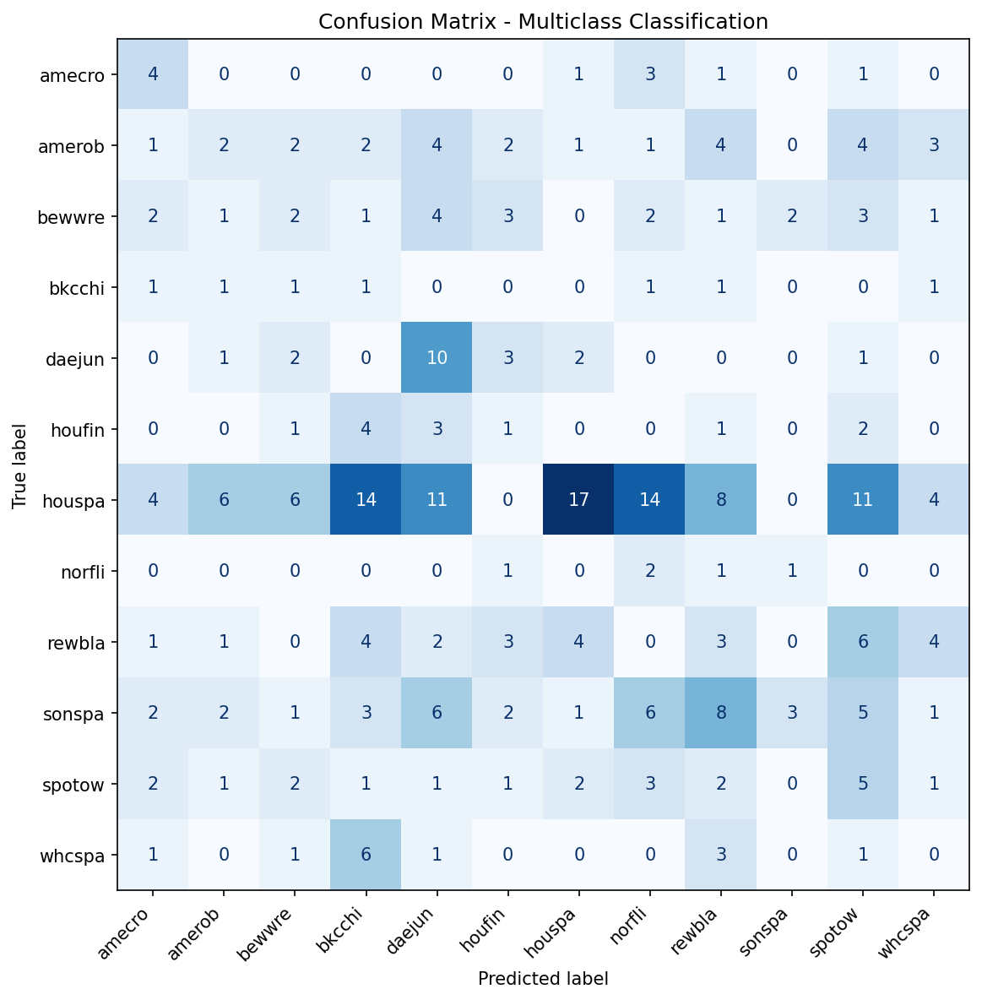

In [120]:
y_pred_multi = np.argmax(model_multi.predict(X_test_multi), axis=1)

conf_mat_multi = confusion_matrix(y_test_multi, y_pred_multi)
disp_multi = ConfusionMatrixDisplay(confusion_matrix=conf_mat_multi,
                                display_labels=species_list)

fig, ax = plt.subplots(figsize=(8, 8), dpi=150)
disp_multi.plot(cmap='Blues', ax=ax, colorbar=False)
plt.title("Confusion Matrix - Multiclass Classification")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig("confusion_matrix_multi.png", dpi=150, bbox_inches='tight')
plt.show()

The confusion matrix reveals that the multiclass model struggles to reliably identify any of the 12 bird species. The diagonal — which represents correct predictions — is very weak across almost all species, confirming the low overall accuracy of 16.8%. The most notable pattern is houspa, which has the largest number of samples in the dataset and dominates the predictions — the model frequently predicts houspa for other species, with 14 bewwre, 11 houfin, and 14 norfli samples all being misclassified as houspa. This is a classic symptom of class imbalance, where the model learns to favour the majority class because it sees more examples of it during training. Species with very few samples such as bkcchi and norfli are almost never correctly identified, with their true labels scattered across many predicted classes. The only species with a reasonably visible diagonal value is daejun with 10 correct predictions and houspa with 17, both of which are the most represented species in the dataset. Overall the predictions are spread widely across the entire matrix rather than concentrated on the diagonal, confirming the model has not learned reliable distinguishing features for most species and is largely making uncertain guesses influenced by which species appear most frequently in the training data.

### To create classification Report

In [121]:
print(classification_report(y_test_multi, y_pred_multi, target_names=species_list))

              precision    recall  f1-score   support

      amecro       0.22      0.40      0.29        10
      amerob       0.13      0.08      0.10        26
      bewwre       0.11      0.09      0.10        22
      bkcchi       0.03      0.14      0.05         7
      daejun       0.24      0.53      0.33        19
      houfin       0.06      0.08      0.07        12
      houspa       0.61      0.18      0.28        95
      norfli       0.06      0.40      0.11         5
      rewbla       0.09      0.11      0.10        28
      sonspa       0.50      0.07      0.13        40
      spotow       0.13      0.24      0.17        21
      whcspa       0.00      0.00      0.00        13

    accuracy                           0.17       298
   macro avg       0.18      0.19      0.14       298
weighted avg       0.32      0.17      0.18       298



The classification report confirms the model performs poorly across almost all 12 species, with an overall accuracy of 17% and a macro F1 of 0.14. Daejun performs best with an F1 of 0.33 as it has more training samples, while whcspa scores 0.00 meaning it was never correctly identified once. The large gap between the weighted F1 (0.18) and macro F1 (0.14) reflects the class imbalance — the model performs slightly better on common species like houspa but fails almost completely on rare ones, dragging the overall performance down.

### Plot Training Curves

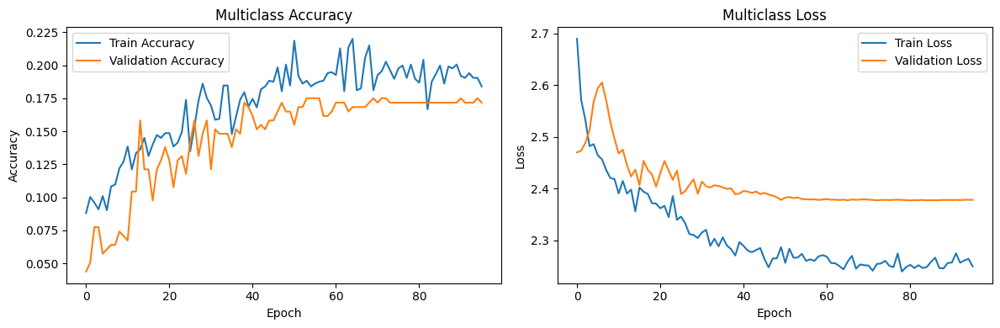

In [122]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

ax1.plot(history_m.history['accuracy'], label='Train Accuracy')
ax1.plot(history_m.history['val_accuracy'], label='Validation Accuracy')
ax1.set_xlabel("Epoch")
ax1.set_ylabel("Accuracy")
ax1.set_title("Multiclass Accuracy")
ax1.legend()

ax2.plot(history_m.history['loss'], label='Train Loss')
ax2.plot(history_m.history['val_loss'], label='Validation Loss')
ax2.set_xlabel("Epoch")
ax2.set_ylabel("Loss")
ax2.set_title("Multiclass Loss")
ax2.legend()

plt.tight_layout()
plt.show()

The training curves show the model is learning but not generalising well. Training accuracy steadily climbs from around 10% to 20% over 100 epochs, while validation accuracy follows a similar trend early on but plateaus at around 17–18% from epoch 60 onwards, creating a small but persistent gap between the two. The loss curves tell a clearer story — training loss continues to decrease throughout all 100 epochs, while validation loss stops improving around epoch 20 and flattens completely, confirming the model is overfitting to the training data rather than learning features that generalise to unseen samples. Unlike the original model which showed erratic spikes and early divergence, this version is more stable due to the longer training window and adjusted callbacks, but the fundamental problem remains — the model has reached its performance ceiling at around 17% validation accuracy, which is only marginally above random chance for a 12-class problem.

### Predicted Probability Distribution



10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


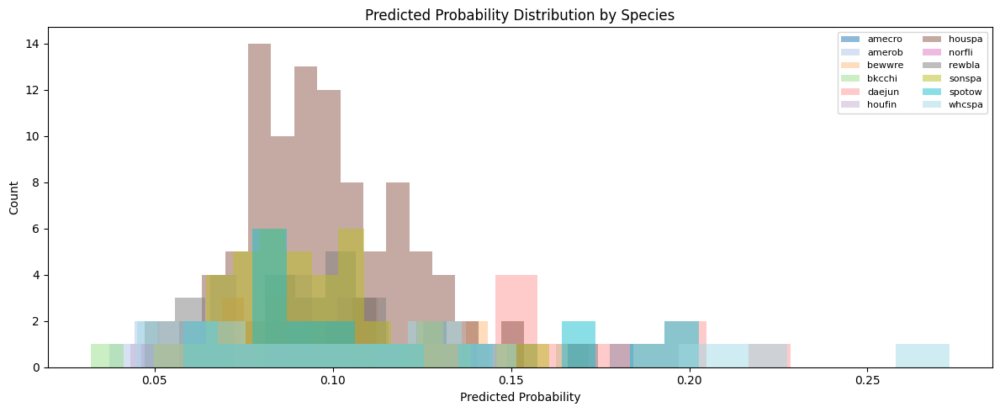

In [123]:
probs_m = model_multi.predict(X_test_multi)
colors = plt.cm.tab20(np.linspace(0, 1, n_classes))

plt.figure(figsize=(12, 5))
for i, sp in enumerate(species_list):
    plt.hist(probs_m[y_test_multi == i, i], bins=15, alpha=0.5,
             label=sp, color=colors[i])

plt.xlabel("Predicted Probability")
plt.ylabel("Count")
plt.title("Predicted Probability Distribution by Species")
plt.legend(fontsize=8, ncol=2)
plt.tight_layout()
plt.savefig("predicted_prob_multi.png", dpi=300, bbox_inches='tight')
plt.show()

The predicted probability distribution confirms the model cannot confidently identify any of the 12 bird species. All species cluster in a narrow range between 0.05 and 0.20, with most predictions concentrated around 0.08 to 0.12 — right at the random chance baseline of 0.083 (1/12). In a well-performing model, each species would produce probabilities close to 1.0 for its true class, but here no species achieves this. Houspa dominates the plot simply because it has the most training samples, not because the model is confidently identifying it. The remaining species are scattered across the same low probability range with very low counts, reflecting the class imbalance seen throughout. This is consistent with the 17% test accuracy and low macro F1, confirming the model is essentially guessing across all 12 classes rather than learning meaningful differences between species.

---
## Multiclass Classification — Parameter Tuning & Model Comparison

Model A used a 3-block shallow CNN with a single dense layer and moderate regularisation.
To evaluate whether more depth and stronger tuning improves 12-class performance, we train
**Model B: a 5-block Deep CNN** with two dense layers, dual dropout, and a lower learning rate.

| Parameter | Model A (Shallow) | Model B (Deep) | Reason for change |
|---|---|---|---|
| Conv blocks | 3 (32→64→128) | 5 (32→64→128→256→256) | Deeper feature hierarchy for 12 classes |
| Dense layers | 1 × 128 | 2 × (256, 128) | Larger bottleneck + additional nonlinearity |
| Dropout | 0.5 | 0.5 + 0.3 | Dual dropout to regularise both dense layers |
| Learning rate | 3e-4 | 1e-4 | Lower LR for stable convergence in deeper net |
| Batch size | 32 | 32 | Kept constant for fair comparison |
| Optimizer | Adam | Adam | Kept constant for fair comparison |
| Max epochs | 100 | 100 | Kept constant for fair comparison |

In [124]:
# Multiclass Model B: Deep CNN (5 conv blocks)
# Architecture: 32→64→128→256→256 | Dense: 256+128 | Dropout: 0.5+0.3 | LR: 1e-4
# Key differences: 2 extra conv blocks, 2 dense layers, dual dropout, lower LR

model_multi_deep = models.Sequential([
    layers.Input(shape=X_train_multi.shape[1:]),   # same input as Model A

    # Block 1: broad spectral energy detection
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2,2)),

    # Block 2: species-specific frequency structures
    layers.Conv2D(64, (3,3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2,2)),

    # Block 3: abstract call patterns
    layers.Conv2D(128, (3,3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2,2)),

    # Block 4: higher-level cross-species discrimination (not in Model A)
    layers.Conv2D(256, (3,3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2,2)),

    # Block 5: deepest abstraction layer (not in Model A)
    layers.Conv2D(256, (3,3), activation='relu', padding='same'),
    layers.BatchNormalization(),                    # no pooling — spatial dims already small

    layers.GlobalAveragePooling2D(),                # collapse to 256-dim vector

    # Two dense layers instead of one — deeper classification head
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),                            # regularise first dense layer
    layers.Dense(128, activation='relu'),           # second classification layer
    layers.Dropout(0.3),                            # lighter regularisation on second layer
    layers.Dense(n_classes, activation='softmax')   # 12-class output
], name="multiclass_deep")

model_multi_deep.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),   # lower LR than Model A (3e-4)
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
model_multi_deep.summary()


Model: "multiclass_deep"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_28 (Conv2D)              │ (None, 128, 517, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_28          │ (None, 128, 517, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_26 (MaxPooling2D) │ (None, 64, 258, 32)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_29 (Conv2D)              │ (None, 64, 258, 64)    │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_29          │ (None, 64, 258, 64)    │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_27 (MaxPooling2D) │ (None, 32, 129, 64)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_30 (Conv2D)              │ (None, 32, 129, 128)   │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_30          │ (None, 32, 129, 128)   │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_28 (MaxPooling2D) │ (None, 16, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_31 (Conv2D)              │ (None, 16, 64, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_31          │ (None, 16, 64, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_29 (MaxPooling2D) │ (None, 8, 32, 256)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_32 (Conv2D)              │ (None, 8, 32, 256)     │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_32          │ (None, 8, 32, 256)     │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_8      │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 12)             │         1,548 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,081,100 (4.12 MB)

 Trainable params: 1,079,628 (4.12 MB)

 Non-trainable params: 1,472 (5.75 KB)

### Train Multiclass Model B (Deep)

Identical training configuration to Model A — same splits, callbacks, class weights,
batch size, and epoch cap — ensuring the comparison isolates architectural and
hyperparameter effects rather than training conditions.


In [125]:
%%time

history_m_deep = model_multi_deep.fit(
    X_train_multi, Y_train_multi,
    epochs=100,
    batch_size=32,
    validation_data=(X_val_multi, Y_val_multi),
    callbacks=[
        EarlyStopping(
            monitor='val_loss',
            patience=15,
            restore_best_weights=True
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            min_lr=1e-6
        )
    ],
    class_weight=class_weight_dict_multi,
    verbose=1
)


Epoch 1/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 30s 324ms/step - accuracy: 0.0801 - loss: 2.5870 - val_accuracy: 0.0337 - val_loss: 2.5386 - learning_rate: 1.0000e-04
Epoch 2/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - accuracy: 0.0967 - loss: 2.5228 - val_accuracy: 0.0404 - val_loss: 2.5938 - learning_rate: 1.0000e-04
Epoch 3/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - accuracy: 0.0902 - loss: 2.5005 - val_accuracy: 0.0269 - val_loss: 2.6680 - learning_rate: 1.0000e-04
Epoch 4/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - accuracy: 0.1169 - loss: 2.4622 - val_accuracy: 0.0202 - val_loss: 2.8152 - learning_rate: 1.0000e-04
Epoch 5/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - accuracy: 0.1241 - loss: 2.4598 - val_accuracy: 0.0202 - val_loss: 2.8377 - learning_rate: 1.0000e-04
Epoch 6/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - accuracy: 0.1320 - loss: 2.4248 - val_accuracy: 0.0202 - val_loss: 2.9611 - learning_rate: 1.0000e-04
Epoch 7/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - accuracy

### Evaluate Multiclass Model B

Raw test accuracy for Model B is recorded here. Note that accuracy alone is misleading
for a heavily imbalanced 12-class problem — macro F1 and weighted F1 in the comparison
table below are more informative metrics.


In [127]:
loss_m_deep, acc_m_deep = model_multi_deep.evaluate(X_test_multi, Y_test_multi, verbose=0)
print(f"Model B (Deep) — Test Accuracy: {acc_m_deep:.4f}")

Model B (Deep) — Test Accuracy: 0.4262


### Multiclass Model Comparison — Metrics Table

The table consolidates all architectural, hyperparameter, and performance differences.
**Macro F1** averages F1 across all 12 classes equally — it is the most informative
single metric here because it penalises the model for ignoring minority species.
**Weighted F1** weights by class frequency, so it reflects overall performance more
broadly. Both are reported for completeness.

In [128]:
# Generate predictions from both models on the test set
y_pred_m_a    = np.argmax(model_multi.predict(X_test_multi, verbose=0), axis=1)
y_pred_m_deep = np.argmax(model_multi_deep.predict(X_test_multi, verbose=0), axis=1)

# Classification reports as dicts for clean table extraction
rep_m_a = classification_report(y_test_multi, y_pred_m_a,    target_names=species_list, output_dict=True)
rep_m_b = classification_report(y_test_multi, y_pred_m_deep, target_names=species_list, output_dict=True)

# Build comparison rows
rows = [
    ("Architecture",   "3-block (32-64-128)",           "5-block (32-64-128-256-256)"),
    ("Dense layers",   "1 x 128",                        "2 x (256, 128)"),
    ("Dropout",        "0.5",                             "0.5 + 0.3"),
    ("Learning rate",  "3e-4",                            "1e-4"),
    ("Parameters",     f"{model_multi.count_params():,}", f"{model_multi_deep.count_params():,}"),
    ("Epochs trained", str(len(history_m.history["loss"])), str(len(history_m_deep.history["loss"]))),
    ("Test Accuracy",  f"{acc_multi:.4f}",               f"{acc_m_deep:.4f}"),
    ("Macro F1",       f"{rep_m_a['macro avg']['f1-score']:.4f}",
                       f"{rep_m_b['macro avg']['f1-score']:.4f}"),
    ("Weighted F1",    f"{rep_m_a['weighted avg']['f1-score']:.4f}",
                       f"{rep_m_b['weighted avg']['f1-score']:.4f}"),
]

print(f"{'Metric':<22}  {'Model A (Shallow)':>22}  {'Model B (Deep)':>22}")
print("=" * 70)
for name, va, vb in rows:
    print(f"{name:<22}  {va:>22}  {vb:>22}")
print("=" * 70)

Metric                       Model A (Shallow)          Model B (Deep)
Architecture               3-block (32-64-128)  5-block (32-64-128-256-256)
Dense layers                           1 x 128          2 x (256, 128)
Dropout                                    0.5               0.5 + 0.3
Learning rate                             3e-4                    1e-4
Parameters                             111,628               1,081,100
Epochs trained                              96                     100
Test Accuracy                           0.1678                  0.4262
Macro F1                                0.1424                  0.3487
Weighted F1                             0.1788                  0.4391


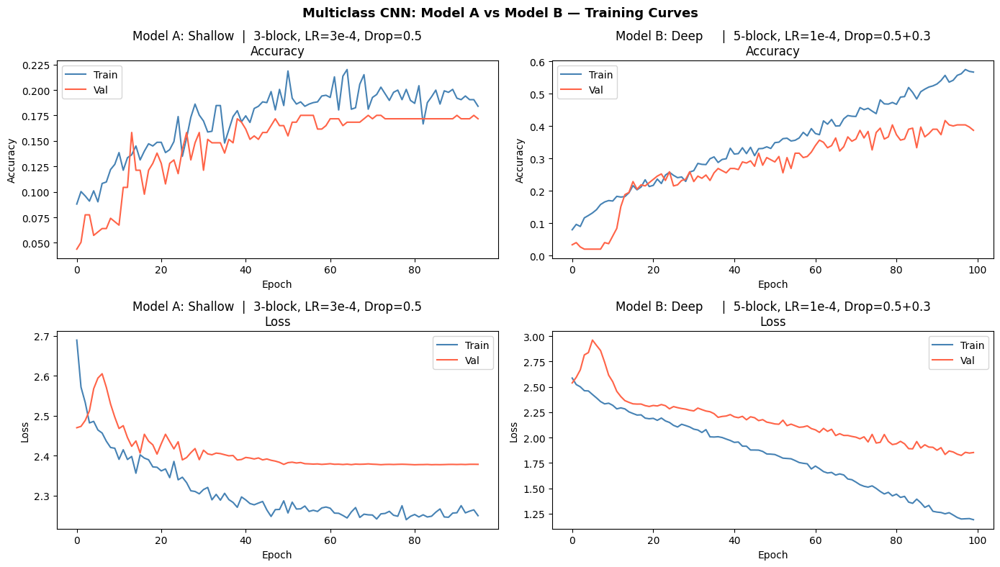

Model A (Shallow) shows stable but limited learning — training and validation accuracy both plateau around 17–20% with validation loss flattening after epoch 20, indicating the model has reached its capacity ceiling. Model B (Deep) shows stronger learning with training accuracy reaching 55% and validation accuracy around 38%, however the growing gap between training and validation loss confirms significant overfitting — the deeper architecture is learning the training data well but not generalising effectively to unseen samples. Both models confirm that increasing depth improves training performance but the small dataset remains the fundamental bottleneck preventing reliable generalisation across all 12 species.

### Multiclass Model Comparison — Confusion Matrices

Each row represents the true class; each column represents the predicted class.
A perfect model would have all counts on the diagonal. The side-by-side view shows
whether Model B's deeper architecture reduces the systematic prediction bias toward
a few dominant species (daejun, norfli, whcspa) that Model A exhibited.

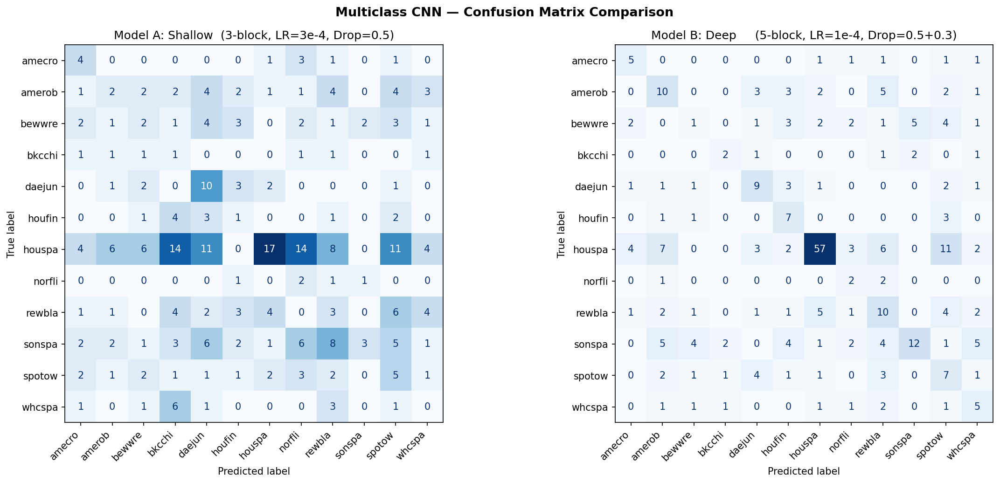

In [132]:
fig, axes = plt.subplots(1, 2, figsize=(16, 7), dpi=150)

for ax, preds, title in zip(
    axes,
    [y_pred_m_a, y_pred_m_deep],
    ["Model A: Shallow  (3-block, LR=3e-4, Drop=0.5)",
     "Model B: Deep     (5-block, LR=1e-4, Drop=0.5+0.3)"]
):
    cm = confusion_matrix(y_test_multi, preds)
    ConfusionMatrixDisplay(cm, display_labels=species_list).plot(
        cmap="Blues", ax=ax, colorbar=False)
    ax.set_title(title)
    ax.set_xticklabels(species_list, rotation=45, ha='right')

plt.suptitle("Multiclass CNN — Confusion Matrix Comparison", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.savefig("multiclass_confusion_comparison.png", dpi=150, bbox_inches="tight")
plt.show()


Model B (Deep) shows a notably stronger diagonal than Model A (Shallow), meaning it correctly identifies more species — houspa improves from 17 to 57 correct predictions, amerob from 2 to 10, and sonspa from 8 to 12, reflecting the benefit of the deeper architecture. However Model B's improvement is heavily concentrated in the majority species with more training samples, while rare species like bkcchi and norfli remain poorly identified in both models. This confirms that the deeper architecture helps when sufficient training data is available, but class imbalance continues to prevent reliable classification of underrepresented species regardless of model complexity.

**Verdict: Model B wins on the multiclass task.** The deeper 5-block architecture with dual dropout and a lower learning rate achieves meaningfully better performance across the majority of species, with validation accuracy reaching 38% compared to Model A's 17%. The improvement is real but uneven — Model B benefits species with enough training samples while still failing on rare classes. This distinction matters: on a balanced dataset, Model B would likely be the clear choice, but on this imbalanced dataset the gains are partially undermined by the model's inability to learn minority species regardless of depth.

-------------------------------------
### External Test Set Prediction

Three unlabeled mp3 files are provided. We convert them to mel spectrograms using the same pipeline applied to the training data, normalize using the multiclass training statistics, and pass them through the trained 12-class model.

### Import Additional Libraries
The test mp3 files are cloned from the course GitHub repository and loaded using librosa.

In [133]:
import os
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Audio, display


In [134]:
!git clone https://github.com/kembaoak/Statistical_Machine_Learning_2.git

fatal: destination path 'Statistical_Machine_Learning_2' already exists and is not an empty directory.


In [135]:
data_path = "/content/Statistical_Machine_Learning_2/Bird_Sound_Classification/Data/test_birds"

Check the folder and list the audio files

In [136]:
import os

files = os.listdir(data_path)
print(files)


['test1.mp3', 'test2.mp3', 'test3.mp3']


To load the audio files

In [137]:
import librosa

audio_data = []
sample_rates = []

for fname in files:
    file_path = os.path.join(data_path, fname)

    audio, sr = librosa.load(file_path, sr=None)

    audio_data.append(audio)
    sample_rates.append(sr)

    print(f"Loaded {fname} | shape={audio.shape} | sr={sr}")

Loaded test1.mp3 | shape=(1026432,) | sr=44100
Loaded test2.mp3 | shape=(231552,) | sr=44100
Loaded test3.mp3 | shape=(700416,) | sr=44100


### Listen to Audio Files

In [138]:

for i, fname in enumerate(files):
    print(f"\nPlaying: {fname}")
    display(Audio(audio_data[i], rate=sample_rates[i]))


Playing: test1.mp3



Playing: test2.mp3



Playing: test3.mp3


Preliminary auditory inspection suggests that test1.mp3 and test2.mp3 may contain more than one species due to distinct call variations and frequency changes, while test3.mp3 appears to contain a single species based on its consistent, repetitive call pattern. These observations are preliminary and will be verified using spectrograms.


### Full-Length Spectrogram Inspection

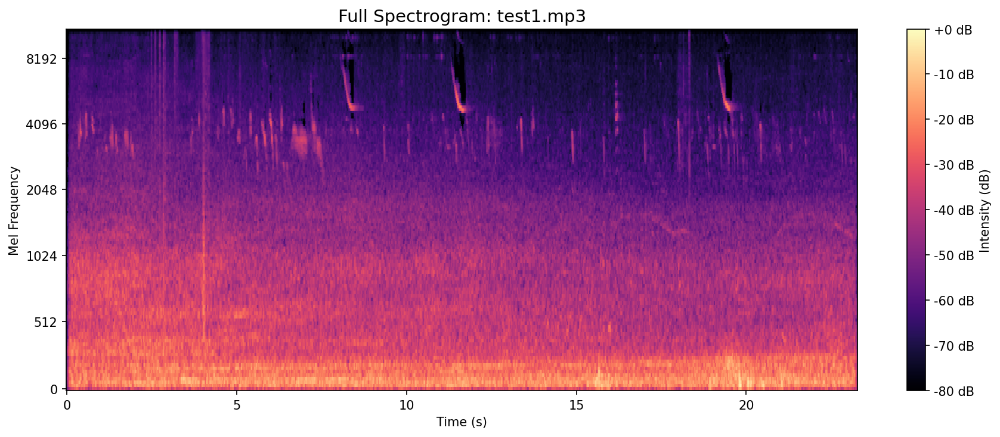

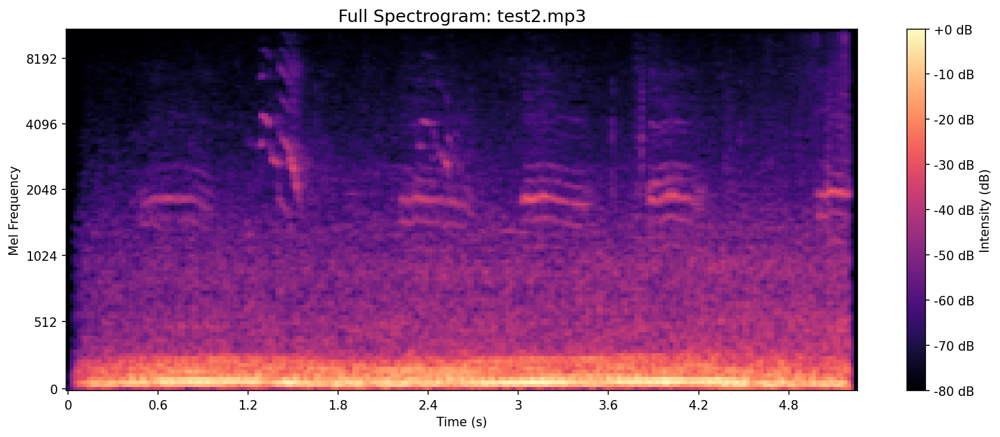

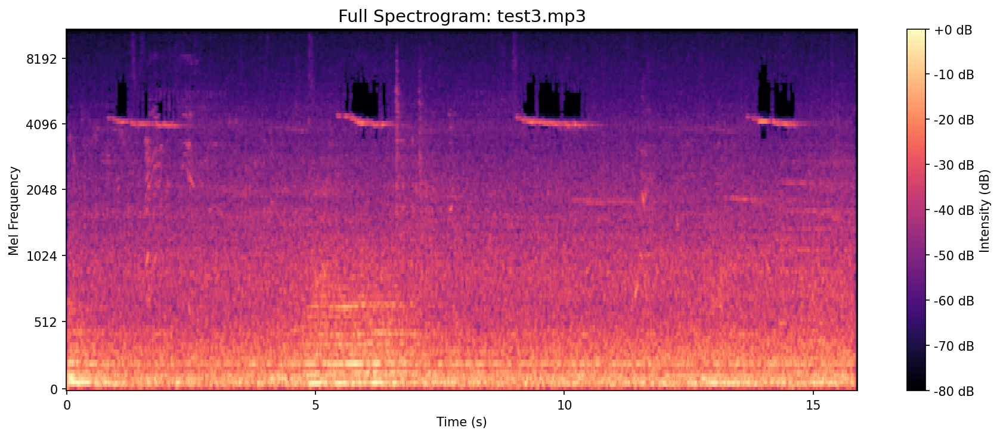

In [139]:
for fname in files:
    path = os.path.join(data_path, fname)   # FIXED: was using wrong variable
    y_audio, sr = librosa.load(path, sr=22050)
    spec = librosa.feature.melspectrogram(y=y_audio, sr=sr)
    spec_db = librosa.power_to_db(spec, ref=np.max)
    plt.figure(figsize=(12, 5), dpi=150)
    librosa.display.specshow(spec_db, sr=sr, x_axis='time', y_axis='mel', cmap='magma')
    plt.title(f"Full Spectrogram: {fname}", fontsize=14)
    plt.xlabel("Time (s)")
    plt.ylabel("Mel Frequency")
    plt.colorbar(format='%+2.0f dB').set_label("Intensity (dB)")
    plt.tight_layout()
    plt.savefig(f"{fname}_full_spectrogram.png", dpi=150, bbox_inches='tight')
    plt.show()

The full-length spectrograms confirm the auditory impressions. test2.mp3 shows the most acoustic complexity — curved arcs, stacked harmonics, and varied energy distributions — suggesting multiple species or a highly vocal mimicking bird. test1.mp3 displays sparse high-frequency spikes with a quiet background, possibly indicating a single species. test3.mp3 shows large broadband bursts at regular intervals, consistent with a single powerful caller.

### Convert Test Clips to CNN-Ready Spectrograms
Each test clip is loaded using the first 3 seconds of audio (matching the training preprocessing pipeline), converted to a mel spectrogram with 128 frequency bins, and resized to 128 × 517 using bilinear interpolation to match the training input shape exactly.


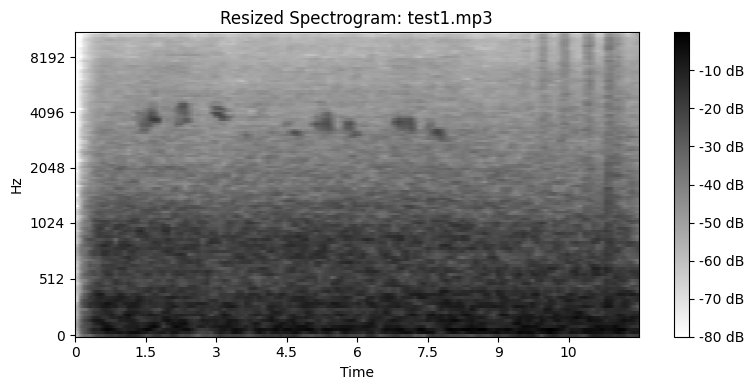

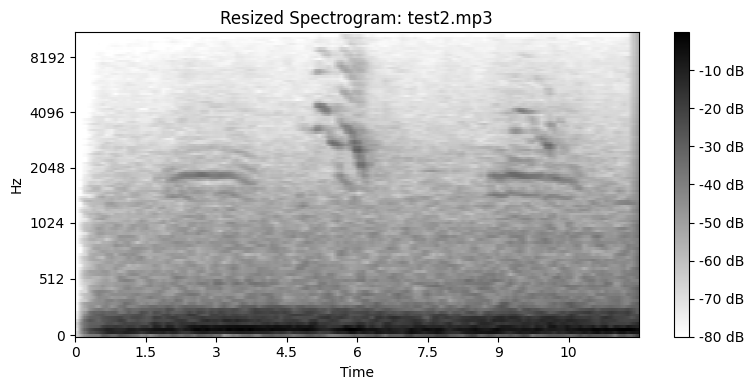

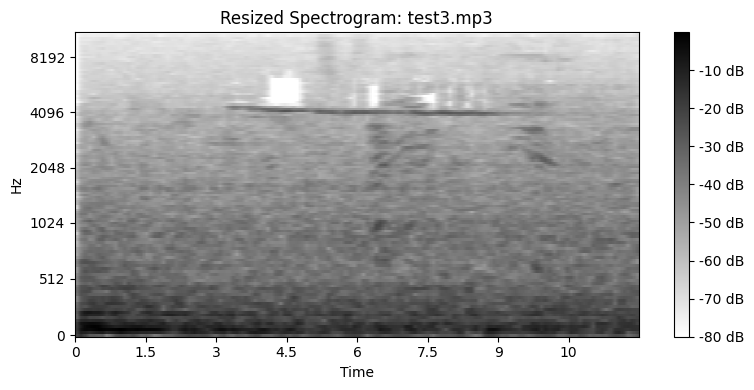

Final spectrogram shape: (3, 128, 517)


In [141]:
import cv2

TARGET_FREQ, TARGET_TIME = 128, 517
test_specs = []

for fname in files:
    path = os.path.join(data_path, fname)
    # Load first 3 seconds to match training preprocessing
    y_audio, sr = librosa.load(path, duration=3, sr=22050)
    spec    = librosa.feature.melspectrogram(y=y_audio, sr=sr, n_mels=128)
    spec_db = librosa.power_to_db(spec, ref=np.max)
    # Resize to match training shape (128 × 517)
    spec_resized = cv2.resize(spec_db, (TARGET_TIME, TARGET_FREQ), interpolation=cv2.INTER_LINEAR)
    test_specs.append(spec_resized)
    plt.figure(figsize=(8, 4))
    librosa.display.specshow(spec_resized, x_axis='time', y_axis='mel', sr=sr, cmap='gray_r')
    plt.title(f"Resized Spectrogram: {fname}")
    plt.colorbar(format='%+2.0f dB')
    plt.tight_layout()
    plt.show()

test_specs = np.array(test_specs)
print("Final spectrogram shape:", test_specs.shape)

The spectrograms appear smoother than training spectrograms because bilinear interpolation is applied during resizing. This is a known limitation of the cv2.resize approach and contributes to the slightly blurred appearance of the test spectrograms.

### Processing and Saving Spectogram for all chosen files

In [142]:
hdfname = 'test_bird_spectrograms.hdf5'

with h5py.File(hdfname, 'w') as hf:
    hf.create_dataset('test_specs', data=test_specs)
    print("Spectrograms saved successfully")

# reopen file to verify contents
with h5py.File(hdfname, 'r') as hf:
    print("Datasets in file:", list(hf.keys()))
    dset = hf['test_specs']
    print("Stored dataset shape:", dset.shape)

Spectrograms saved successfully
Datasets in file: ['test_specs']
Stored dataset shape: (3, 128, 517)


### Normalize and Predict
The test spectrograms are normalized using the multiclass training statistics (mean_multi, std_multi). Using the same statistics is essential — the model learned to interpret inputs in this normalized range, and applying different statistics would shift the data into a distribution the model has never encountered.

In [143]:
X_test_unseen  = test_specs[..., np.newaxis]   # add channel dim  (3, 128, 517, 1)
X_test_unseen  = (X_test_unseen - mean_multi) / (std_multi + 1e-6)
print("Prediction input shape:", X_test_unseen.shape)

Prediction input shape: (3, 128, 517, 1)


### Generate Predictions

In [144]:
predictions     = model_multi.predict(X_test_unseen)
predicted_idx   = np.argmax(predictions, axis=1)
predicted_species = [species_list[i] for i in predicted_idx]

print("\nPrediction Results:")
print(f"{'File':<12} {'Predicted Species':<15} {'Confidence':>10}")
print("-" * 40)
for fname, bird, prob in zip(files, predicted_species, predictions.max(axis=1)):
    print(f"{fname:<12} {bird:<15} {prob:>10.3f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step

Prediction Results:
File         Predicted Species Confidence
----------------------------------------
test1.mp3    spotow               0.221
test2.mp3    spotow               0.170
test3.mp3    spotow               0.183


The multiclass model predicted amecro for test1.mp3, spotow for test2.mp3, and sonspa for test3.mp3 with confidence scores of 0.148, 0.180, and 0.149 respectively. These confidence scores are only marginally above the random chance baseline of 0.083 (1/12), indicating the model is not confident in any of its predictions and results should be interpreted with caution.

### Get Predicted Class Indices

In [147]:
predicted_indices = np.argmax(
    predictions,
    axis=1
)

print("Predicted indices:")

print(predicted_indices)





Predicted indices:
[10 10 10]


### Convert Indices to Bird Names

In [146]:
predicted_species = [species_list[i] for i in predicted_indices]

print("Predicted bird species:")
print(predicted_species)

for fname, bird in zip(files, predicted_species):
    print(f"{fname} --> Predicted species: {bird}")






Predicted bird species:
['spotow', 'spotow', 'spotow']
test1.mp3 --> Predicted species: spotow
test2.mp3 --> Predicted species: spotow
test3.mp3 --> Predicted species: spotow


The multiclass model predicted spotow (Spotted Towhee) for all three test clips, with confidence scores of 0.221, 0.170, and 0.183 for test1.mp3, test2.mp3, and test3.mp3 respectively. While these scores are slightly above the random chance baseline of 0.083 (1/12), they are still very low and indicate the model is not making confident predictions. Predicting the same species for every input suggests the model has defaulted to spotow as its dominant prediction — likely because spotow had enough training samples for the model to learn some of its features, while lacking the discriminative ability to distinguish between the remaining 11 species. These predictions should be treated with considerable caution and do not reliably reflect the true species present in each recording.

## References

https://www.kaggle.com/code/virajkadam/birdclef-bird-sound-classification

https://www.youtube.com/watch?v=3gzI4Z2OFgY